# MSDM5004 Final Project - By Cheng Wing Kit

Probelm C. Image Compression and Denoising

a) Compress the given image file by JPEG with 𝑞⃗ = (1, 1, 1), (1, 10, 10), and (10, 20, 20). Show the compressed images. In each case, count the percentage of Fourier coefficients in each of the three channels that has been discarded (originally non-zero but becomes zero after quantization). Also calculate the average relative difference of each of the three channels in each case. The average relative difference is the absolute value of the ratio of the difference divided by the original value, average over all entries. Comment on your findings.

Original image
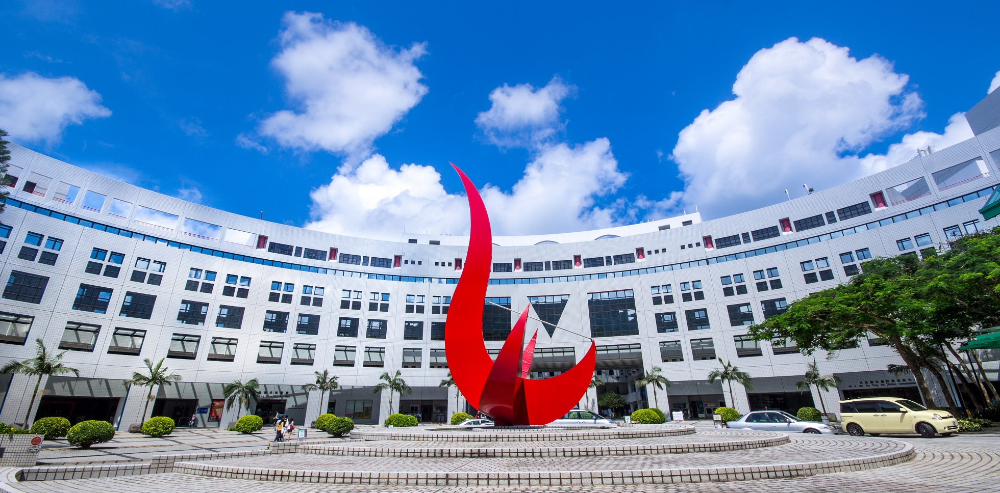

In [1]:
from PIL import Image
import numpy as np
import cv2
im_path = 'C:\\Users\\cwk05\\Desktop\\DDM\\5004\\Assignment\\Project\\4714_0.png' # path storing the image
im_noise_path = 'C:\\Users\\cwk05\\Desktop\\DDM\\5004\\Assignment\\Project\\4714_noised.png' # path storing the image with noise
img = np.array(Image.open(im_path).convert('YCbCr'))             # Load image
Q = np.array([[16,11,10,16,24,40,51,61],
            [12,12,14,19,26,58,60,55],
            [14,13,16,24,40,57,69,56],
            [14,17,22,29,51,87,80,62],
            [18,22,37,56,68,109,103,77],
            [24,35,55,64,81,104,113,92],
            [49,64,78,87,103,121,120,101],
            [72,92,95,98,112,100,103,99]])
layers = ['luminance','blue chrominance','red chrominance']      # layers'name

def compress(image,q):
    image = image.astype('int64')
    Compressed = np.zeros(image.shape).astype(int)
    for layer in range(3):
        Q1 = Q*q[layer]
        for i in range(int(image.shape[0]/8)):
            for j in range(int(image.shape[1]/8)):
                M = image[i*8:(i+1)*8, j*8:(j+1)*8, layer] - 128 # Partition
                D = cv2.dct(np.float32(M))                       # DCT
                DQ = (D/Q1).round().astype(int)                  # Quantization
                Compressed[i*8:(i+1)*8, j*8:(j+1)*8, layer] = DQ
    discard = np.zeros(3)                                        
    isize = image.shape[0]*image.shape[1]
    for layer in range(3):
        discard[layer] = (np.count_nonzero(Compressed[:,:,layer]==0)-np.count_nonzero(D==0))/isize # Discarded coefficient count
    return Compressed, discard

# Show compressed image
def decompress(image_compressed):
    Decompressed = np.zeros(image_compressed.shape).astype(int)
    for layer in range(3):
        for i in range(int(image_compressed.shape[0]/8)):
            for j in range(int(image_compressed.shape[1]/8)):
                M = (image_compressed[i*8:(i+1)*8, j*8:(j+1)*8, layer])
                DD = M*Q
                Decompressed[i*8:(i+1)*8, j*8:(j+1)*8, layer] = cv2.idct(np.float32(DD))  # Inverse DCT
    Decompressed += 128
    return Decompressed.astype("uint8")

In [2]:
print('q = (1,1,1)')
q1 = np.array([1,1,1])
c1, z1 = compress(img,q1)
dc1 = decompress(c1)
Image.fromarray(dc1,'YCbCr').save('c1.jpg')
# To deal with orginal value being 0, the relative difference is defined as abs(difference-original)/(1+abs(original))
ard=np.zeros(3)
for i in range(3):
    print(f'Discarded % of {layers[i]} layer = {z1[i]*100:.2f} %')
    ard[i] = np.average(np.abs(dc1[:,:,i].astype("int64")-img[:,:,i].astype("int64"))/(1+img[:,:,i].astype("int64")))
    print(f'Average Relative Difference of {layers[i]} layer = {ard[i]:.4f}')

q = (1,1,1)
Discarded % of luminance layer = 85.48 %
Average Relative Difference of luminance layer = 0.2155
Discarded % of blue chrominance layer = 96.30 %
Average Relative Difference of blue chrominance layer = 0.0071
Discarded % of red chrominance layer = 96.11 %
Average Relative Difference of red chrominance layer = 0.0096


compressed image with 𝑞⃗ = (1,1,1)
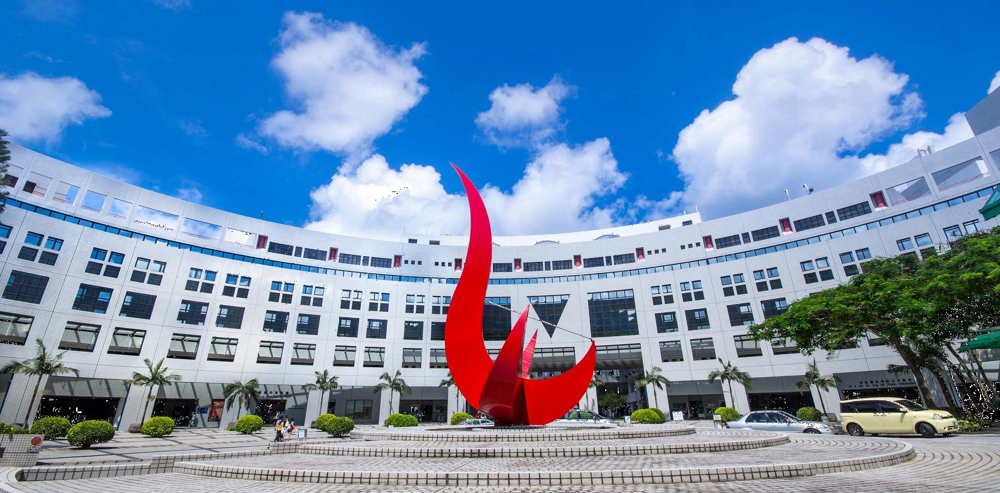

In [3]:
print('q = (1,10,10)')
q2 = np.array([1,10,10])
c2, z2 = compress(img,q2)
dc2 = decompress(c2)
Image.fromarray(dc2,'YCbCr').save('c2.jpg')
# To deal with orginal value being 0, the relative difference is defined as abs(difference-original)/(1+abs(original))
ard=np.zeros(3)
for i in range(3):
    print(f'Discarded % of {layers[i]} layer = {z2[i]*100:.2f} %')
    ard[i] = np.average(np.abs(dc2[:,:,i].astype("int64")-img[:,:,i].astype("int64"))/(1+img[:,:,i].astype("int64")))
    print(f'Average Relative Difference of {layers[i]} layer = {ard[i]:.4f}')

q = (1,10,10)
Discarded % of luminance layer = 85.48 %
Average Relative Difference of luminance layer = 0.2155
Discarded % of blue chrominance layer = 98.97 %
Average Relative Difference of blue chrominance layer = 0.1424
Discarded % of red chrominance layer = 99.13 %
Average Relative Difference of red chrominance layer = 0.2686


compressed image with 𝑞⃗ = (1,10,10)
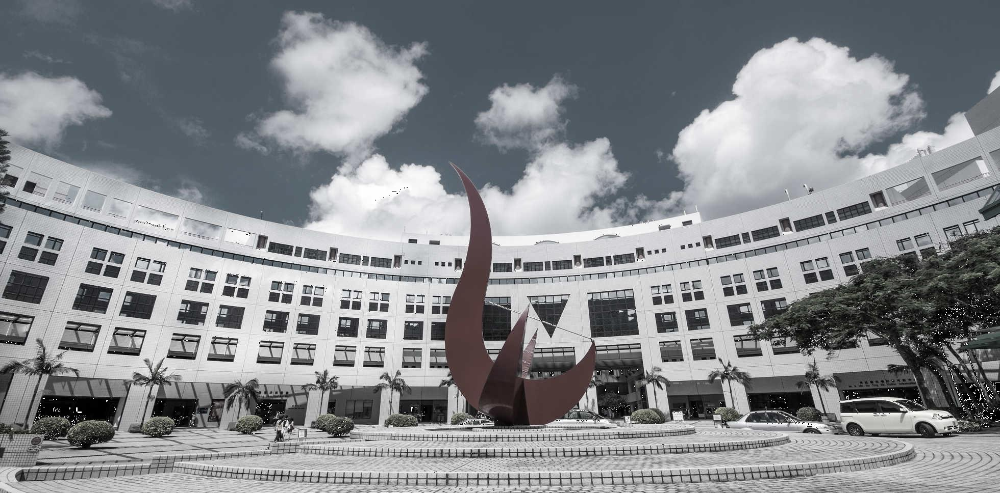

In [4]:
print('q = (10,20,20)')
q3 = np.array([10,20,20])
c3, z3 = compress(img,q3)
dc3 = decompress(c3)
Image.fromarray(dc3,'YCbCr').save('c3.jpg')
# To deal with orginal value being 0, the relative difference is defined as abs(difference-original)/(1+abs(original))
ard=np.zeros(3)
for i in range(3):
    print(f'Discarded % of {layers[i]} layer = {z3[i]*100:.2f} %')
    ard[i] = np.average(np.abs(dc3[:,:,i].astype("int64")-img[:,:,i].astype("int64"))/(1+img[:,:,i].astype("int64")))
    print(f'Average Relative Difference of {layers[i]} layer = {ard[i]:.4f}')

q = (10,20,20)
Discarded % of luminance layer = 96.70 %
Average Relative Difference of luminance layer = 1.1031
Discarded % of blue chrominance layer = 99.34 %
Average Relative Difference of blue chrominance layer = 0.1492
Discarded % of red chrominance layer = 99.45 %
Average Relative Difference of red chrominance layer = 0.2817


compressed image with 𝑞⃗ = (10,20,20)
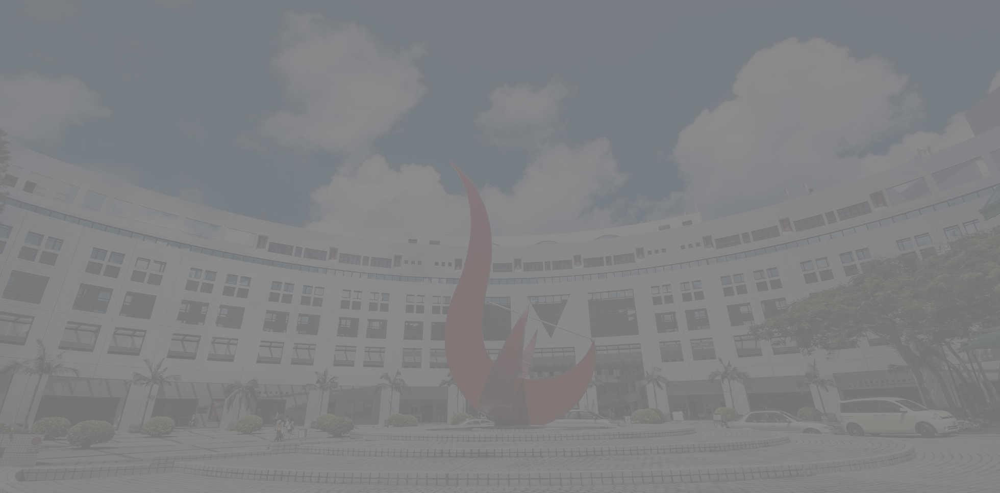

Comment (a): The compressed image using 𝑞⃗ = (1,1,1) does not vary much with the original image. Using 𝑞⃗ = (1,10,10), it is clear that the color of the image become darker due to more information is lost for both Cb and Cr layer. For 𝑞⃗ = (10,20,20), we can see that the image becomes darker and dimmer. Comparing with 𝑞⃗ = (1,10,10), the information lost in Cb and Cr layer is similar but the information in the Y layer was greatly reduced.

b) Redo part (a) but with DFT instead of DCT. Compare and comment on the performance of DFT to DCT.

In [5]:
def compress_dft(image,q):
    image = image.astype('int64')
    Compressed = np.zeros(image.shape).astype(int)
    discard = np.zeros(3)
    for layer in range(3):
        Q1 = Q*q[layer]
        for i in range(int(image.shape[0]/8)):
            for j in range(int(image.shape[1]/8)):
                M = image[i*8:(i+1)*8, j*8:(j+1)*8, layer] - 128           # Partition
                D = cv2.dft(np.float32(M),flags=cv2.DFT_COMPLEX_OUTPUT)    # DFT
                D_0 = np.count_nonzero(D==0)                               # Number of 0 in D
                DD = np.zeros(D.shape)
                DQR = (D[:,:,0]/Q1).round().astype(int)                    # Quantization on Real Part
                DQI = (D[:,:,1]/Q1).round().astype(int)                    # Quantization on Imaginary Part
                DDR = DQR*Q1
                DDI = DQI*Q1
                DD[:,:,0] = DDR
                DD[:,:,1] = DDI
                discard[layer] += np.count_nonzero(DD==0) - D_0            # Update discarded count
                M1 = cv2.idft(np.float32(DD),flags=cv2.DFT_SCALE)          # Inverse DFT
                Compressed[i*8:(i+1)*8, j*8:(j+1)*8, layer] = M1[:,:,0] + 128
    isize = image.shape[0]*image.shape[1]*2
    return Compressed.astype('uint8'), discard/isize


In [6]:
print('q = (1,1,1)')
q1 = np.array([1,1,1])
c1f, z1f = compress_dft(img,q1)
Image.fromarray(c1f,'YCbCr').save('c1f.jpg')
# To deal with orginal value being 0, the relative difference is defined as abs(difference-original)/(1+abs(original))
ard=np.zeros(3)
for i in range(3):
    print(f'Discarded % of {layers[i]} layer = {z1f[i]*100:.2f} %')
    ard[i] = np.average(np.abs(c1f[:,:,i].astype("int64")-img[:,:,i].astype("int64"))/(1+img[:,:,i].astype("int64")))
    print(f'Average Relative Difference of {layers[i]} layer = {ard[i]:.4f}')

q = (1,1,1)
Discarded % of luminance layer = 56.17 %
Average Relative Difference of luminance layer = 0.1265
Discarded % of blue chrominance layer = 72.48 %
Average Relative Difference of blue chrominance layer = 0.0048
Discarded % of red chrominance layer = 74.39 %
Average Relative Difference of red chrominance layer = 0.0066


compressed image with 𝑞⃗ = (1,1,1)
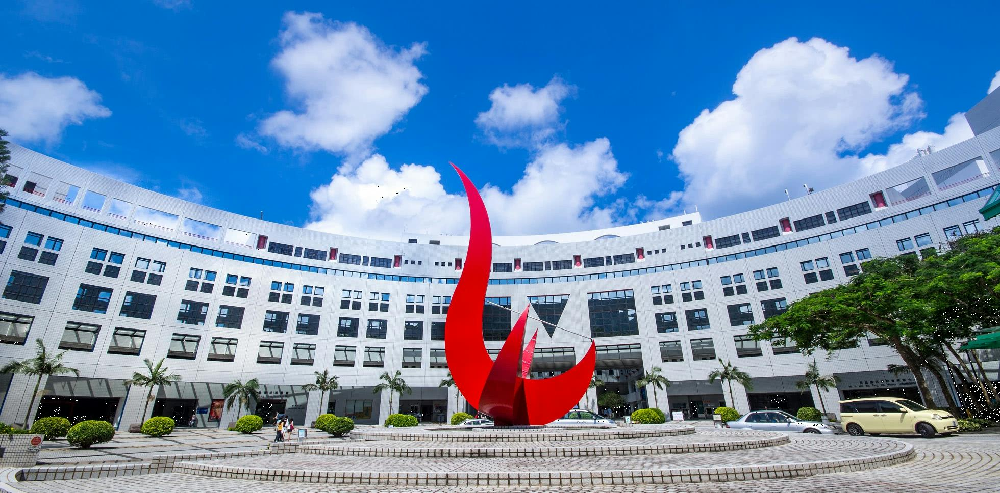

In [7]:
print('q = (1,10,10)')
q2 = np.array([1,10,10])
c2f, z2f = compress_dft(img,q2)
Image.fromarray(c2f,'YCbCr').save('c2f.jpg')
# To deal with orginal value being 0, the relative difference is defined as abs(difference-original)/(1+abs(original))
ard=np.zeros(3)
for i in range(3):
    print(f'Discarded % of {layers[i]} layer = {z2f[i]*100:.2f} %')
    ard[i] = np.average(np.abs(c2f[:,:,i].astype("int64")-img[:,:,i].astype("int64"))/(1+img[:,:,i].astype("int64")))
    print(f'Average Relative Difference of {layers[i]} layer = {ard[i]:.4f}')

q = (1,10,10)
Discarded % of luminance layer = 56.17 %
Average Relative Difference of luminance layer = 0.1265
Discarded % of blue chrominance layer = 81.11 %
Average Relative Difference of blue chrominance layer = 0.0102
Discarded % of red chrominance layer = 83.45 %
Average Relative Difference of red chrominance layer = 0.0134


compressed image with 𝑞⃗ = (1,10,10)
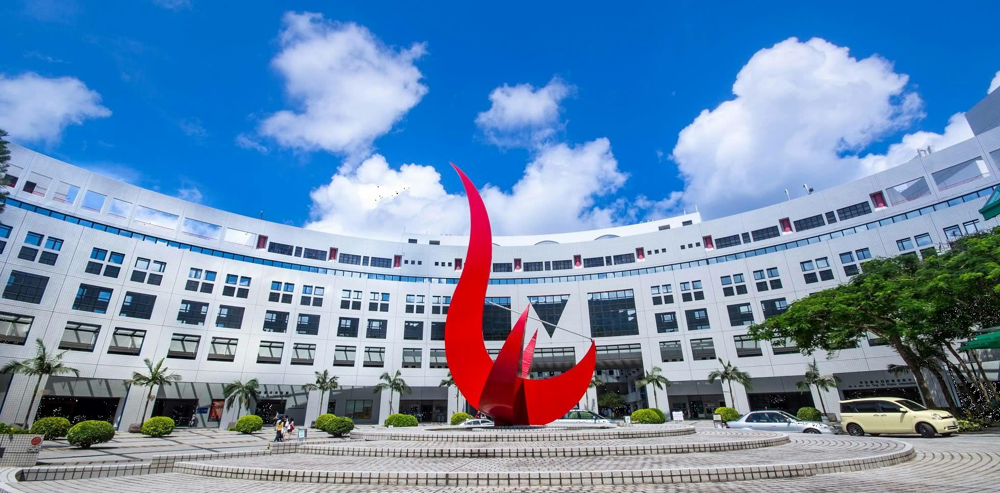

In [8]:
print('q = (10,20,20)')
q3 = np.array([10,20,20])
c3f, z3f = compress_dft(img,q3)
Image.fromarray(c3f,'YCbCr').save('c3f.jpg')
# To deal with orginal value being 0, the relative difference is defined as abs(difference-original)/(1+abs(original))
ard=np.zeros(3)
for i in range(3):
    print(f'Discarded % of {layers[i]} layer = {z3f[i]*100:.2f} %')
    ard[i] = np.average(np.abs(c3f[:,:,i].astype("int64")-img[:,:,i].astype("int64"))/(1+img[:,:,i].astype("int64")))
    print(f'Average Relative Difference of {layers[i]} layer = {ard[i]:.4f}')

q = (10,20,20)
Discarded % of luminance layer = 86.42 %
Average Relative Difference of luminance layer = 0.1704
Discarded % of blue chrominance layer = 81.69 %
Average Relative Difference of blue chrominance layer = 0.0145
Discarded % of red chrominance layer = 84.05 %
Average Relative Difference of red chrominance layer = 0.0200


compressed image with 𝑞⃗ = (10,20,20)
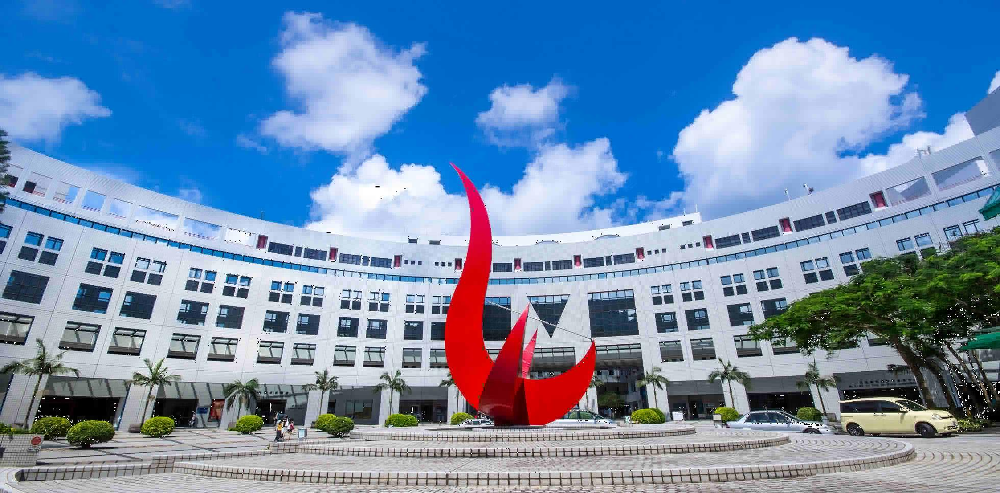

Comment (b): The compress performance of DCT is better than DFT as the discarded percentage using DCT is higher than DFT under the same 𝑞⃗. It is because the matrix Q was optimized for DCT, information lost using DFT is less as smaller portion of coefficients become 0 after rounding. The result using 𝑞⃗ = (10,20,20) for DCT and DFT are quite different, in which there is no observable darkening effect for DFT. It is because in general the coefficient of 0 frequency obtained from DFT is very large such that the effect of matrix Q made no observable change for small 𝑞⃗.

c) Explain why the algorithm is lossy. In which step(s) is information lost?

Comment (c): Information is lost when rounding is done to the D/Q matrix. The information of frequencies of which the coefficient being rounded to 0 is lost and could be not recovered.

d) A corrupted image of the image in part (a) and (b) is generated by adding random errors to the pixels. Denoise the image using the method described above.

In [9]:
img_noise = np.array(Image.open(im_noise_path).convert('YCbCr'))    # Load image
def denoising(image,threshold):
    image = image.astype('int64').copy()
    r, c, l  = image.shape
    denoise = np.zeros(image.shape,dtype=complex)
    for layer in range(l):
        M = image[:,:,layer]
        D = np.fft.fft2(np.float32(M))                              # FFT
        D[int(r*threshold):int(r*(1-threshold)),:] = 0
        D[:,int(c*threshold):int(c*(1-threshold))] = 0
        denoise[:,:,layer] = np.fft.ifft2(D)                        # inverse FFT           

    return np.abs(denoise).astype('uint8')

n = np.array([0.01,0.015,0.02,0.025,0.03,0.035,0.04,0.045,1])
dim = []
for i in n:
    dim.append(denoising(img_noise,i))
rdim = []
for idx, j in enumerate(dim):
    if idx % 3 == 0:
        temp = j
    else:
        temp = np.hstack((temp,j))
    if idx % 3 == 2:
        rdim.append(temp)

combined = np.vstack(rdim)
Image.fromarray(combined,('YCbCr')).save('Denoise.jpg')

The image is denoised by keeping only the coefficients of the lowest n% frequencies, where n = 

$$\begin{bmatrix} 1\% & 1.5\% & 2\% \\ 2.5\% & 3\% & 3.5\% \\ 4\% & 4.5\% & 100\% \end{bmatrix}$$

in the picture below:

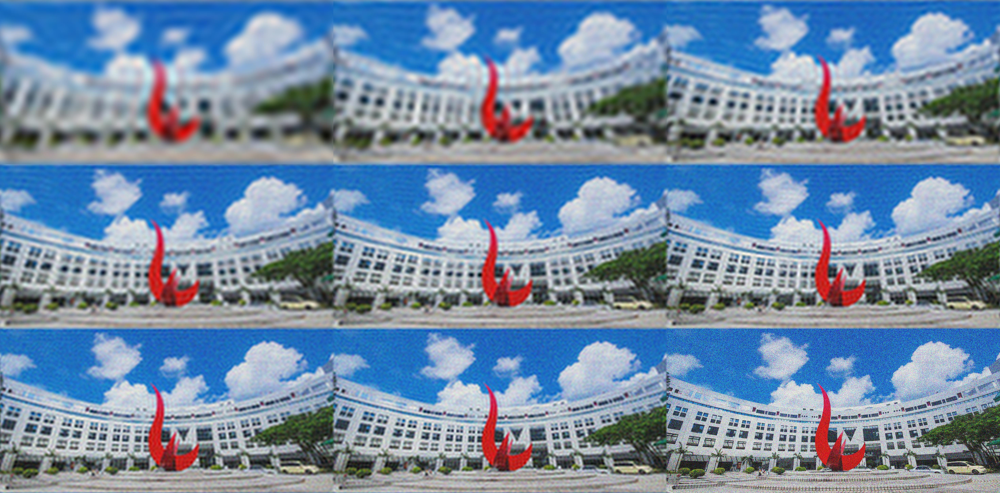

e) Explain why the method works.

Comment (e): When the image is transformed into the frequency domain, the random noise tends to spread over the coefficients. So when coefficients of higher frequency vanished, the noise would be reduced. Since most of the information of the original image is stored at low frequencies, the information lost should be less than the noise reduced. The method is thus worked. However, it should be noted that some of the features in the original image would also be removed. The threshold should therefore be carefully selected such that most of the information of the original image could be retained while the remaining noise is acceptable.